# Energy Analysis in a Residential Home

## Background

We are considering alternative energy supply options to lower the electricity bill and possibly to sustain our household during power outages.  The electrical supply in South Africa is managed poorly and we experience regular scheduled power cuts, politely called "Load Scheduling".  Solar power is a viable alternative to supplement or even replace the purchase of electricity from the electric utility company (Eskom in ZA).

All analyses are done against a particular background. In this case the initial objective was to review the facts towards the purchase of an [IMEON 3.6](http://www.imeon-energy.com/imeon-9-12/) system - or the [Victron](http://www.victronenergy.com/) equivalent (BlueSolar 150/70, Multiplus 48/5000/70 or48/3000/35).  In the end I decided to buy the Imeon, see the details of how it performs towards the end of the document.

Will you find advice here on whether you should install a PV system? Probably not.  The decision to install a PV system  is a highly personal matter. It depends on your energy needs, financial position and your attitude towards the big Green Thing.  I share with you what I learned, but your decision is up to yourself. Don't thank me and don't blame me, just review my findings and believe what you will and do as you please.

## Status of this document

This document serves to capture my analysis regarding solar power for home use.  It is  a document still in process, and will be for many years. When complete I would like to

1. Determine a few fundamental rules of thumb to be able to speak to suppliers from an authoritative position.  This objective has largly been met in the analysis of my residential power consumption.

1. Determine a suitable design for my needs: how large a PV panel and how large a battery bank should be used? This objective has  been partially met.  A 6 kW solar panel and 3 kW+3kW multistack Imeon inverter should be sufficient. The larger the battery, the better.

1. Consider the financial implication of solar energy for my house.  At the outset is was quite clear that a fully off-grid system is not a financially viable option. The input costs are just too high.  But how big is the financial hit?  This analysis is not done yet.

Most of the work in this analysis was done in 2016/7. With some updates towards the end of the document in March 2019.


## Document structure

The document has three main parts:
    
1. Measurement and analysis of the power use in a residential home.

2. Simulations using open source tools to investigate the best tradeoff point in terms of panel size and in particular battery bank capacity.

1. Measurements on my installed solar panels, comprising 12 quare metres of panels and a 3 kW inverter (no batteries).

## Prepare for calculations

In [44]:
import numpy as np
import scipy as sp
import pandas as pd
import pyradi.ryplot as ryplot
import os.path
from scipy.optimize import curve_fit
import datetime
from dateutil.parser import parse
from collections import defaultdict
import re

%matplotlib inline

# %reload_ext autoreload
# %autoreload 2

import pyradi.ryplot as ryplot
# import pyradi.ryplanck as ryplanck
# import pyradi.ryfiles as ryfiles
# import pyradi.rymodtran as rymodtran

# import xlsxwriter

from IPython.display import HTML
from IPython.display import Image
from IPython.display import display
from IPython.display import FileLink, FileLinks

# make pngs at 150 dpi
import matplotlib as mpl
mpl.rc("savefig", dpi=150)
mpl.rc('figure', figsize=(10,8))
%config InlineBackend.figure_format = 'svg'

pd.set_option('display.max_columns', 80)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', 150)

# Energy use analysis

We live in a 240 m2 North-facing free standing house in the urban residential area of Centurion, Gauteng, South Africa (25$^\circ$51$^\prime$S, 28$^\circ$10$^\prime$E).  The house currently supports three adults, two of whom are working off-site during the day.  The house has a 150 litre and a 80 litre geyser (water heater), an often used stove hob and oven, and a 1.5 kW pool pump. We love cooking and the stove and oven are used regularly. Since 2018 we are using two induction stove plates instead of the hob.   The 150 litre geyser is covered with an insulating blanket and controlled by a [Geyserwise](www.geyserwise.co.za/) timer.  The 80 litre geyser is controlled only by a simple thermostat, with no timing control.  
We have two fridges (one very old and the other not super efficient) and two freezers (one freezer sold later in 2017).

Electrical geyser versus a solar heated geyser. Our geyser has a 2 kW electrical heater element, which is turned on for two hours early in the morning. For the rest of the day it is off.
An alternative would be to install a solar heating system for the geyser, that would alleviate the peak electrical power requirements. So yes, solar geyser heating are a better alternative to electrical geysers, I know.  

This analysis is based on domestic energy measurements for several months in 2015/6, over summer and winter months.  In winter we tend to use heaters on some (not all) cold evenings, if the wood fire is not burning.  In summer the refrigerators and freezers energy usage goes up considerably. This past summer we had exceptionally hot weather; in the high 30s and low 40s C. We do not use air conditioners in summer, simply bear the heat.


We have an [Engage Efergy](http://efergy.com/uk/products/engage-hub-kit) monitor that samples the electricity use at one-minute intervals.  This section analyses our energy use during approximately three weeks in the (winter) month of June. During this time we used room heaters on some afternoons and evenings, but the pool pump was not running.

Read the file and form a few new columns from the existing data.  The data in the input file is given in units of Watt-minutes.

In [45]:
filenames = ['data/201506-efergy.csv','data/201507-efergy.csv','data/201508-efergy.csv',
            'data/201509-efergy.csv','data/201510-efergy.csv','data/201511-efergy.csv',
            'data/201512-efergy.csv','data/201601-efergy.csv','data/201602-efergy.csv']

dmonths = {1:'January', 2:'February', 3:'March',4:'April', 5:'May', 6:'June',
    7:'July', 8:'August', 9:'September',10:'October', 11:'November', 12:'December'}

# filenames = ['data/201507-efergy.csv']
for i,filename in enumerate(filenames):
    if i == 0:
        df = pd.read_csv(filename)
        df.columns = ['DateTime','Wm']
    else:
        dfn = pd.read_csv(filename)
        dfn.columns = ['DateTime','Wm']
        df = df.append(dfn)

# remove all (empty) lines with NaN values
df = df[df.Wm.notnull()]
# calc the energy in kWh
df['kWm'] = df['Wm'] / 1000.
df['kWh'] = df['Wm'] * 60. / 1000.
# convert from string to datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])
# set index to be the date-time
df = df.set_index('DateTime')

The first graph shows the use at one-minute intervals over the whole period.  Note that at times there were quite high one-minute peaks, beyond 6 kW, almost reaching 10 kW.


In this analysis I consider the 6 kW peak as relevant because the Imeon can supply 6 kW peaks with 3 kW coming from the batteries (if present) and 3 kW coming from the grid. So an Imeon with a battery bank can supply brief 6 kW peaks.

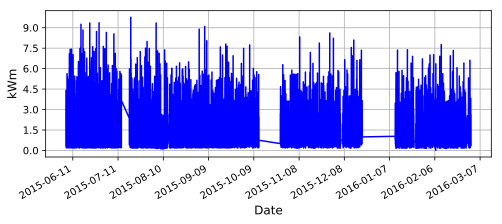

In [46]:
p = ryplot.Plotter(1,1,1, figsize=(8,3));
p.plot(1, df.index.values, df['kWm'],'','Date','kWm',xIsDate=True,xtickRotation=30);

The peaks are somewhat concerning, but not a problem if their durations are very short.  The next analysis show all runs that exceed a 6 kW level.  The first graph shows the individual runs as function of time.  The second graph shows the number of occurrences versus run length.

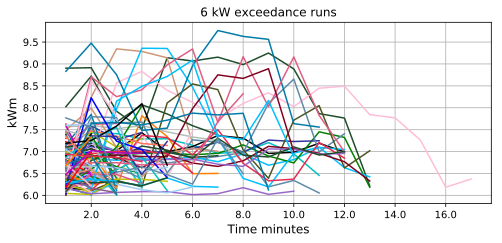

In [47]:
thr = 6
dfp = df.copy()
dfp['1'] = np.ones(dfp.kWm.shape)
# select portions exceeding the threshold
dfp['thr'] = np.where(dfp['kWm']>thr, 1, 0)
# get the individual runs that exceed the threshold
dfp['RunID'] = (dfp.thr != dfp.thr.shift()).cumsum()
# select only the runs above threshold
dfps = dfp[dfp['thr'] == 1].copy()

# accumulate run length info
rlens = defaultdict(int)
q = ryplot.Plotter(2,2,1, figsize=(8,8));
for group in df.groupby(dfps.RunID):
    dfd = group[1].copy()
    rlens[dfd.index.shape[0]] += 1
    dfd['t'] = np.cumsum(np.ones(dfd.index.shape))
    q.plot(1, dfd['t'], dfd['kWm'],'6 kW exceedance runs','Time minutes','kWm');



Number of occurrences  188
Number of occurrences  less than one minute 78


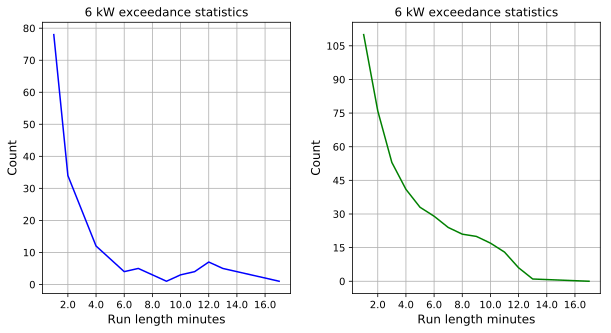

In [48]:
rlensx = np.asarray([[item,rlens[item]] for item in sorted(rlens.keys())])
q = ryplot.Plotter(2,1,2, figsize=(10,5));
q.plot(1, rlensx[:,0], rlensx[:,1],'6 kW exceedance statistics','Run length minutes','Count');
maxcnt = np.max(np.cumsum(rlensx[:,1]))
print(f'Number of occurrences  {maxcnt}')
print(f'Number of occurrences  less than one minute {rlensx[0,1]}')
q.plot(2, rlensx[:,0], maxcnt-np.cumsum(rlensx[:,1]),'6 kW exceedance statistics','Run length minutes','Count');


The graph above shows that during the observation period (just over nine months) there were 
- 78 occurrences (every 3.5 days)  where the 6 kW limit was exceeded for less than one minute. 
- 105 occurrences (every 2.6 days)  where the 6 kW limit was exceeded for more than one minute. 
- 16 occurrences (every 17 days) where the 6 kW limit was exceeded for more than ten minutes. 


The statistics of the 'instantaneous' power use are shown below.  Note that less than 1% of the one-minute slots exceeded 6 kW usage.  Only 15% of the time did the power use exceed 3 kW.  However, when considering the graphs above, it seems that there can be lengthy runs of relatively high power use. For example, the graph above seems to indicate frequent runs of 8 kW for time durations up to ten minutes, and even one run of 16 minutes exceeding 6 kW.



Note the peaks around 2.0-2.5 kW and 3.0-3.5 kW.  The second peak stems from the large geyser's 3 kW element plus the 'normal background' power use.

    Power kW  Probability
0        0.0     0.000003
1        1.0     0.732134
2        2.0     0.827914
3        3.0     0.912894
4        4.0     0.981805
5        5.0     0.992272
6        6.0     0.998023
7        7.0     0.999289
8        8.0     0.999810
9        9.0     0.999946
10      10.0     1.000000


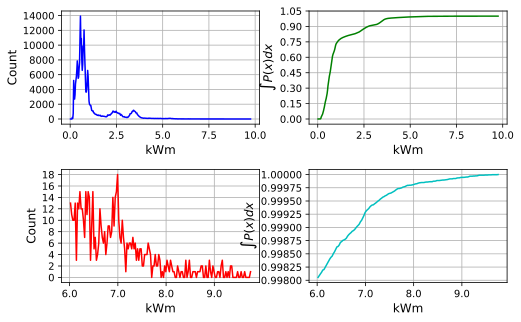

In [49]:
q = ryplot.Plotter(2,2,2, figsize=(8,5));
hst, bins = np.histogram(df['kWm'],bins=400,density=False)
binc = (bins[1:]+bins[:-1])/2
sumHist = np.cumsum(hst).astype(np.float)
select = (binc >= 6)
sumUpToSelect = np.sum(hst[binc < 6])
q.plot(1, binc, hst,'','kWm','Count', maxNX=5);
q.plot(2, binc, sumHist/sumHist[-1],'','kWm','$\int P(x)dx$', maxNX=5);
q.plot(3, binc[select], hst[select], '','kWm','Count', maxNX=5);
q.plot(4, binc[select], (sumUpToSelect + np.cumsum(hst[select]))/sumHist[-1],
       '','kWm','$\int P(x) dx$', maxNX=5);

normsumHist = sumHist/sumHist[-1]
pval = np.linspace(0.,10.,11)
prob = np.interp(pval, binc, normsumHist )
pvsp = pd.DataFrame(np.hstack((pval.reshape(-1,1), prob.reshape(-1,1))),columns=['Power kW','Probability'])
print(pvsp)   


Next we consider the run lengths vs power levels. The graph shows the number of times (y-axis) that the labelled power use setting was maintained for the times shown on the x-axis.    Note that the graph is truncated on both axes, the data continues beyond the limits shown here.  

Note that the shortest measurement time in one minute, so this graph should be interpreted as a one-minute slot where the power level did occur, even if only for a faction of a second.

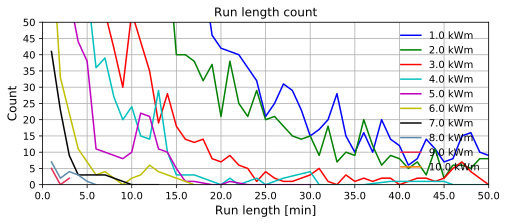

In [50]:
# https://github.com/pydata/pandas/issues/5494
# df = pd.DataFrame({"A": [1,1,2,3,2,2,3], "B": [1]*7})
# df.groupby((df.A != df.A.shift()).cumsum())["B"].sum()

dft = df.copy()
dft['1'] = np.ones(dft.kWm.shape)
thrs = np.linspace(0., 10, 11)

p = ryplot.Plotter(1,1,1, figsize=(8,3));
for thr in thrs[1:]:
    dft['thr'] = np.where(dft['kWm']>thr, 1, 0)
    # dft['Run'] = dft.groupby('thr')['1'].sum()
    # a = dft.groupby('thr')['1'].sum()

    # look for changes
    dft['Change'] = (dft.thr != dft.thr.shift())
    # count the runlength in each change
    dft['ChangeSum'] = (dft.thr != dft.thr.shift()).cumsum()
    #select only the runs above threshold
    select = (dft['thr'] == 1)
    # count the lengths of each and all runs
    rcnt = dft.ChangeSum[select].value_counts()
    # sort by length of run to get meaningful plots
    runs = rcnt.value_counts().sort_index() - 1

    p.plot(1, runs.index.values, runs.values,'Run length count','Run length [min]','Count', 
           label=['{} kWm'.format(thr)], pltaxis=[0,50, 0, 50]);


The following graph shows the energy use per day over the month.

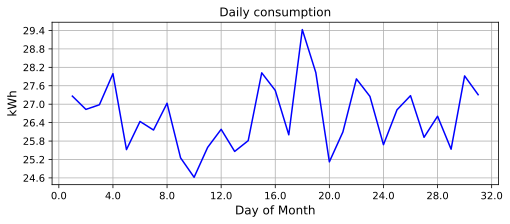

In [51]:
dailysum = df.copy()
dailysum['1'] = np.ones(dailysum.kWm.shape)
dailysum = dailysum.groupby(lambda x: (x.day)).sum() 
dailysum['kWh'] = 24 * dailysum['kWm'] / (dailysum['1'])
dailysum.drop(['Wm','kWm','1'], axis=1, inplace=True)
p = ryplot.Plotter(1,1,1, figsize=(8,3));
p.plot(1, dailysum.index.values, dailysum['kWh'],'Daily consumption','Day of Month','kWh');

If we plot the daily usage, all on the same graph, it gets quite confusing, because the usage patterns are not really well correlated.  This is largely attributable to the small geyser and room heating switching on at random times.  There are a few apparent patterns:  

-  The large geyser switching on early on the morning (on a GeyserWise timer)
-  Some peaks around 10:00 in the morning (clothes ironing, house cleaning)
-  Peaks in the afternoon/evening (cooking, room heating)

The most important observation here is that the peaks occur outside of the period of peak solar energy.  Therefore, some form of energy storage would be required to make use of solar energy.  The two obvious storage mechanisms are warming the water in the geyser and storing electrical energy in batteries.   Storing energy in warm water should alleviate the early morning peak so some extent (provided there is not a significant heat loss during the night).  The only way to store solar energy for the evening peak is in electrical batteries.

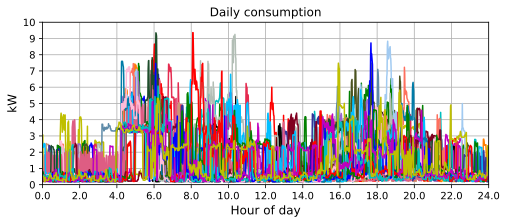

In [52]:
p = ryplot.Plotter(1,1,1, figsize=(8,3));
for group in df.groupby(df.index.day):
    dfd = group[1].copy()
    dfd['1'] = np.ones(dfd.index.shape)
    dfd['HoD'] =  dfd['1'].cumsum()/60.
    p.plot(1, dfd['HoD'], dfd['kWm'],'Daily consumption','Hour of day','kW',
          pltaxis=[0,24,0,10 ], maxNX=12);

This graph shows the average daily consumption over the full period, as function of time of day with one minute intervals.

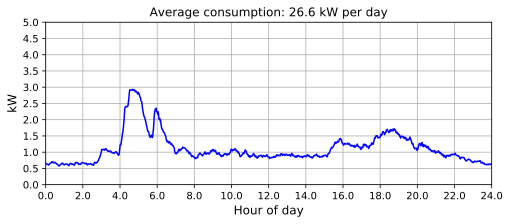

In [53]:
minmeans = df.copy()
minmeans['1'] = np.ones(minmeans.kWm.shape)

minmeans = minmeans.groupby(lambda x: (x.time())).sum()
minmeans['kW'] =  minmeans['kWm'] / (minmeans['1'])
minmeans.drop(['Wm','kWm','kWh','1'], axis=1, inplace=True)
minmeans['1'] = np.ones(minmeans.index.shape)
minmeans['HoD'] =  minmeans['1'].cumsum()/60.
totkW = minmeans['kW'].sum()/60
p = ryplot.Plotter(1,1,1, figsize=(8,3));
p.plot(1, minmeans['HoD'], minmeans['kW'],'Average consumption: {:.1f} kW per day'.format(totkW),
       'Hour of day','kW',pltaxis=[0,24,0,5 ], maxNX=12);

The consumption averaged over all days show clear trends, but aggregates out some of the consumption peaks which could be managed, if these are visible.  



The following shows the averages for each month

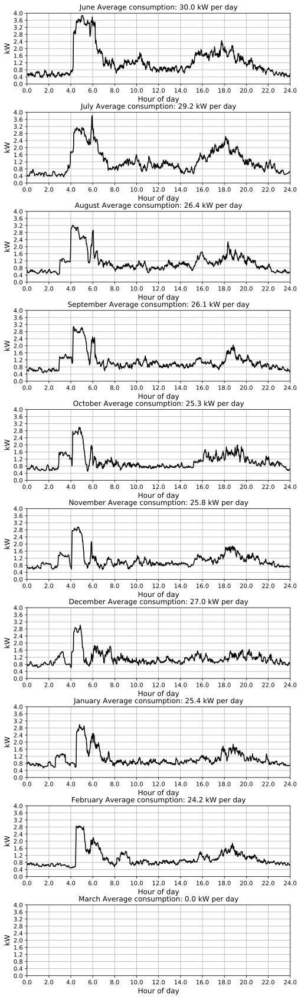

In [54]:
minmeans = df.copy()
minmeans['1'] = np.ones(minmeans.kWm.shape)
minmeans['months'] = minmeans.index.month
umonths = minmeans['months'].unique()

p = ryplot.Plotter(1,len(umonths),1, figsize=(8,3*len(umonths)));
p.resetPlotCol()
pcols = [p.nextPlotCol() for m in umonths ]
for i,(pcol,month) in enumerate(zip(pcols,umonths)):
    y = minmeans[minmeans.months==month].copy()
    y = y.groupby(lambda x: (x.time())).sum()
    y['kW'] =  y['kWm'] / (y['1'])
    y.drop(['Wm','kWm','kWh','1'], axis=1, inplace=True)
    y['1'] = np.ones(y.index.shape)
    y['HoD'] =  y['1'].cumsum()/60.
    totkW = y['kW'].sum()/60
    p.plot(1+i, y['HoD'], y['kW'],
           '{} Average consumption: {:.1f} kW per day'.format(dmonths[month],totkW),
           'Hour of day','kW',pltaxis=[0,24,0,4 ], maxNX=12,plotCol='k');

The above graphs clearly shows an increase in the base load (between midnight and early morning) during summer months.  In winter the fridge and freeezer load is smaller than in summer months.

The next analysis shows the consumption as a function of time of day, but for each weekday on its own.  This analysis shows clear trends on certain days.  The consumption during the days can be attributed to specific events, such as geysers house cleaning and ironing and the use of room heaters.  

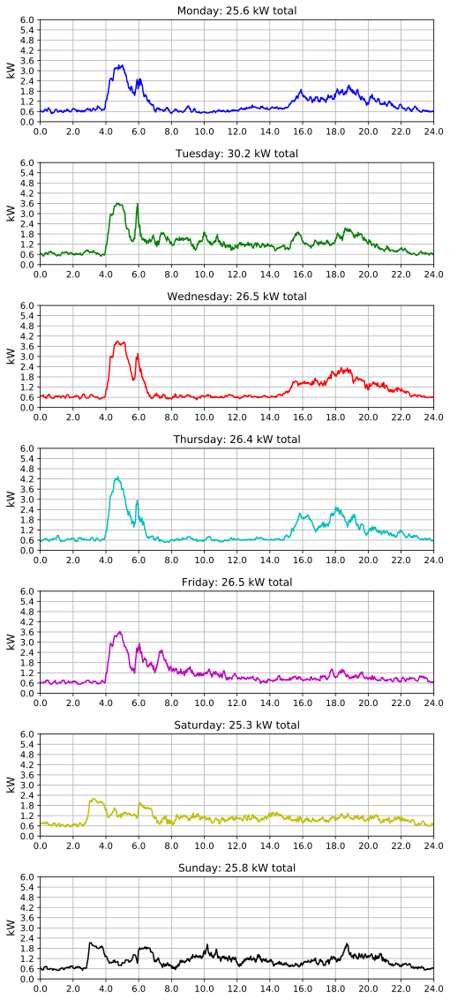

In [55]:
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dfd = df.copy()
dfd['Dates'] = dfd.index
dfd['week_days'] = dfd.index.weekday
x =dfd.pivot_table(index='Dates', columns='week_days', values='kWm', aggfunc='mean')

p = ryplot.Plotter(1,7,1, figsize=(8,20));
for wday in [0,1,2,3,4,5,6]:
    dfwd = x[np.isfinite(x.iloc[:,wday])].iloc[:,wday] 
    dfwd = dfwd.groupby(lambda x: (x.time())).mean()
    
    tb = pd.DataFrame(np.ones(dfwd.index.shape))
    tb['HoD'] =  tb.iloc[:,0].cumsum()/60.
    totkW = dfwd.sum()/60
    p.plot(wday+1, tb['HoD'], dfwd,'{}: {:.1f} kW total'.format(days[wday],totkW),'','kW',
          pltaxis=[0,24,0,6 ], maxNX=12);

In [56]:
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dfd = df.copy()
dfd['Dates'] = dfd.index
dfd['week_days'] = dfd.index.weekday
x = dfd.pivot_table(index='Dates', columns='week_days', values='kWm', aggfunc='mean')
x['months'] = x.index.month

p = ryplot.Plotter(1,7,1, figsize=(8,40));
umonths = x['months'].unique()
pcols = [p.nextPlotCol() for m in umonths ]
for pcol,month in zip(pcols,umonths):
    y = x[x.months==month].copy()
    for wday in [0,1,2,3,4,5,6]:

        
        dfwd = y[np.isfinite(x.iloc[:,wday])].iloc[:,wday] 
        dfwd = dfwd.groupby(lambda x: (x.time())).mean()

        tb = pd.DataFrame(np.ones(dfwd.index.shape))
        tb['HoD'] =  tb.iloc[:,0].cumsum()/60.
#         totkW = dfwd.sum()/60
        p.plot(wday+1, tb['HoD'], dfwd,'{}'.format(days[wday]),'','kW',
              pltaxis=[0,24,0,6 ],plotCol=[pcol], maxNX=12,label=[dmonths[month]]);
    


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



If the 150 litre water geyser can be supplied from a solar geyser or from an alternative PV supply. If this load is excluded from the rest of the supply it simplifies load management a bit. The geyser timer runs at 3kW for two hours in the morning.  This load is simply subtracted from the average load - somewhat simplistic, but the answer is still a reasonably good indication of the energy use.

Secondly, we decided to bypass the heavy draining equipment such as the stove, the room heaters and tumble drier from the PV system.  The exact energy use is not known, but for the moment  2 kWh over the time period 15:00-19:00 is removed from the daily use profile.

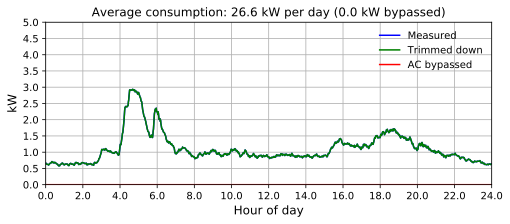

In [57]:
# removes = [[253,10,2.3], [263,115,3.0],[900,230,0.5], [420, 600, -0.75] ]
removes = [[253,10,2.3], [263,115,3.0],[900,230,0.5] ]
removes = [ ]

minmeans = df.copy()
minmeans['1'] = np.ones(minmeans.kWm.shape)
minmeans = minmeans.groupby(lambda x: (x.time())).sum()
minmeans['kW'] =  minmeans['kWm'] / (minmeans['1'])
minmeans.drop(['Wm','kWm','kWh','1'], axis=1, inplace=True)
minmeans['1'] = np.ones(minmeans.index.shape)
minmeans['HoD'] =  minmeans['1'].cumsum()/60.
totkW = minmeans['kW'].sum()/60

minmsansG = minmeans.copy()

for remove in removes:
    lo = remove[0]
    hi = lo + remove[1]
    minmsansG['kW'][lo:hi] = minmsansG['kW'][lo:hi] - remove[2]
minmsansG['kW'] = np.where(minmsansG['kW']<0.5, 0.5, minmsansG['kW'])

totkWsansG = minmsansG['kW'].sum()/60
reqAC = minmsansG['kW']
timeB = minmsansG['HoD']
removedAC = minmeans['kW'] - reqAC
totkWRemoved = removedAC.sum()/60

p = ryplot.Plotter(1,1,1, figsize=(8,3));
p.plot(1, timeB, minmeans['kW'],label=['Measured']);
p.plot(1, timeB, reqAC,'','','',pltaxis=[0,24,0,5], maxNX=12,label=['Trimmed down']);
p.plot(1, timeB, removedAC,'Average consumption: {:.1f} kW per day ({:.1f} kW bypassed)'.format(totkWsansG,totkWRemoved),
       'Hour of day','kW',pltaxis=[0,24,0,5], maxNX=12,label=['AC bypassed']);


# Simulations

In this section several design configurations are considered, using the average daily (winter) consumption.  This 'average' analysis shows at best average performance: short term peaks are considered adequately handled by the inverter hardware.  

The simulation analysis is a gross simplification, but attempts to find the maximum solar PV panel supply capacity and battery capacity required to make best use of the solar energy. This analysis is very much simplified in the sense that (1) the cost of equipment is not considered, (2) we model solar energy generation to be a cosine with base width of 10 hours centred around 12:00 noon and peak of 0.6 kWAC/kWPanel (of course one must consider local solar time, also the day is not 10 hours long).  

The duration of the day and generation peak of 0.6 kW AC per 1 kW panel rating is motivated on the Harare results shown below.  Out location is quite far from Harare, but this is more or less relevant and the best information I have.

This time-step simulation starts at any user-selectable time, on the assumption of a fully charged battery.  The load discharges the battery down to the depth of discharge limit, after which the grid supply is used as energy source.  The simulation run until 24:00 and then starts the next day, running until the start time on the next afternoon, after which the cycle is assumed to be the same.  

The household requirement is around 30kWh per day, which is quite high because the water heating and cooking energy use are included in this budget.  Most energy-conscious homes will use thermal heating for the geyser and gas for cooking.  In my case we have reasons for not doing this.  

*In this analysis we assume a house with split wiring where 7.1 kWh will be supplied outside of the inverter (supply bypassed around the inverter) to accommodate water heating in the geyser and cooking.* So **this is not an off-grid analysis.**  We can simulate something like off-grid by forcing the system to export 7 kWh to the grid, to counter the infeed --- this would be something like off-grid but not exactly.  I would like to some day change this code to also include a truly off-grid mode.

The following function models the energy flow during the 24-hour period.  The user can define the PV power panel capability, battery parameters etc.  See the comments in the function body for more detail.

In [58]:
def calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
                maxInverter,maxBatCharge,reqAC,removedAC, cost=1.5, storedinGrid=False):
    """Calculate a 24-hour energy use time profile.

    Args:
        | tstrt (float): decimal time in hours when UPS operation starts
        | ratingPV (float): PV rating of the solar panels [W]
        | batvolt (float): battery voltage [V]
        | batCap (float): battery capacity [Ah]
        | batDoD (float): allowable battery depth of discharge [pu]
        | batACEff (float): AC generation efficiency from battery [pu]
        | batDCEff (float): DC battery charge efficiency [pu]
        | maxInverter (float): maximum inverter generation capability [W]
        | maxBatCharge (float): maximum battery charge current [A]
        | reqAC (np.array(float)): trimmed down required AC power temporal profile [kW]
        | removedAC (np.array(float)): trimmed required AC power temporal profile [kW]
        | cost (float): electricity cost [R/kW]
        | storedinGrid (bool): True if energy could be stored in the grid

    Returns:
        | A number of temporal profiles.

    Raises:
        | No exception is raised.
    """

    # timeB, reqAC
    genPV = ratingPV * 0.7 * np.cos( (timeB-12.0) * np.pi / 10  )
    genPV = np.where(genPV<0, 0 , genPV)

    bat2ACi = batCap * batACEff * (1-batDoD) * 60. # Wm available as AC energy
    batchmax = maxBatCharge * batvolt # battery charge at maxBatCharge A max
    tcyc = tstrt 

    p = ryplot.Plotter(1,5,1, figsize=(8,8));
    for i in [0,1]:
        # do this twice, first time to obtain battery state for second time actual
        bat2AC = bat2ACi if i==0 else engBatt[int((tcyc-1)%1440)]
        engBatt = np.zeros((24 * 60, 1))
        engGrd = np.zeros((24 * 60, 1))
        engLst = np.zeros((24 * 60, 1))
        engBatt[int(tcyc%1440)] = bat2AC
        battOn = False
#         for tsim in np.linspace(0,24,1440):
        for tsim in np.arange(0,24 * 60):

            # if there is solar power, charge the battery first, then supply house
            PVavail = genPV[int(tcyc%1440)]
            battState = engBatt[int(tcyc%1440)][0]
            if PVavail <= 0:  #  solar power available
                PVused = 0
            else:
                if battState < bat2ACi:  # battery not yet fully charged,
                    # calculate the available charge
                    PVcharge = batchmax if PVavail >=batchmax else PVavail
                    # then charge by that much
                    battState += PVcharge * batDCEff
                    # this energy is left for use in the house
                    PVavail -= PVcharge
                # use excess PV power to supply the house load
                PVused = PVavail if reqAC[int(tcyc%1440)] * 1000. > PVavail else reqAC[int(tcyc%1440)] * 1000.
                # this is not used to charge battery or used in house
                PVavail -= PVused
                # this much PV energy was not used for charging or load
                engLst[int(tcyc%1440)] = PVavail

            if tcyc%1440 >= tstrt and battState > 0.:
                battOn = True  # switch on the UPS

            if battOn:
                inverterAC = maxInverter if reqAC[int(tcyc%1440)] * 1000. > maxInverter else reqAC[int(tcyc%1440)] * 1000.
                battUsed = inverterAC if battState >= inverterAC else battState
                battState -= battUsed
            else:
                battUsed = 0.


            if battState <= 0.:
                battOn = False

            engBatt[int((tcyc+1)%1440)] = battState 

            # energy pulled from the grid
            engGrd[int((tcyc)%1440)] = reqAC[int(tcyc%1440)] * 1000. - battUsed - PVused
            tcyc += 1
    if i==1:
        factor = 1000. * 60.
#         gridReqTotal = reqAC.reshape(-1,1)+removedAC.reshape(-1,1)
#         gridReqIncl = (reqAC.reshape(-1,1)+removedAC.reshape(-1,1)).sum()/60
        gridReqTotal = reqAC + removedAC
        gridReqIncl = (reqAC + removedAC).sum()/60
#         gridInBypass = 1000*(removedAC.reshape(-1,1)).sum()/factor
        gridInBypass = 1000*(removedAC).sum()/factor
        gridReqExcl = 1000. * reqAC.sum()/factor
        PVEnergyGen = genPV.sum()/factor
        if storedinGrid:
            PVEnergyLost = 0.
            PVEnergyStoredGrid = engLst.sum()/factor
            PVnetUse = PVEnergyGen - PVEnergyStoredGrid
        else:
            PVEnergyLost = engLst.sum()/factor
            PVEnergyStoredGrid = 0.
            PVnetUse = PVEnergyGen - PVEnergyLost
        gridInExcl = engGrd.sum()/factor
         
        print('Batteries require {:.0f} Wh, {:.0f} Ah from PV panels to charge'.format(bat2ACi/60., bat2ACi/(60.*batvolt)))
        print('Batteries charge at {:.0f} W ({} A) maximum'.format(batchmax,batchmax/48.))
        print('Required household energy total {:.1f} kWh '.format(gridReqIncl))
    #     print('Required household energy bypass {:.1f} kWh '.format(gridInBypass))
    #     print('Required household energy less bypass {:.1f} kWh '.format(gridReqExcl))
        print('PV energy generated {:.1f} kWh '.format(PVEnergyGen))
        print('PV energy lost {:.1f} kWh '.format(PVEnergyLost))
        print('PV energy stored in grid {:.1f} kWh '.format(PVEnergyStoredGrid))
        print('PV energy used {:.1f} kWh '.format(PVnetUse))
        print('Grid feed {:.1f} kWh '.format(gridInExcl))
    #     print('Grid feed excluding bypass {:.1f} kWh '.format(gridInExcl))
    #     print('Grid feed including bypass {:.1f} kWh '.format(gridReqIncl-PVnetUse))
        print('Energy cost R{:.2f}/kWh '.format(cost))
        print('Net energy from PV {:.1f} kWh {:.1f}% of total, cost savings R{:.2f}/day '.format(
                PVnetUse+PVEnergyStoredGrid, 100*(PVnetUse+PVEnergyStoredGrid)/gridReqIncl,
                (PVnetUse+PVEnergyStoredGrid)*cost))
        print('Net energy from grid {:.1f} kWh {:.1f}% of total, remaining grid cost is R{:.2F}/day '.format(
                gridReqIncl-PVnetUse-PVEnergyStoredGrid, 
                100*((gridReqIncl-PVnetUse-PVEnergyStoredGrid)/gridReqIncl),
                (gridReqIncl-PVnetUse-PVEnergyStoredGrid)*cost))

        # print(PVEnergyGen - PVEnergyLost + gridInExcl )   
        title = 'PV energy generation {:.1f} kWh ({} kW Panels)'.format(PVEnergyGen, ratingPV/1000.)
        p.plot(1, timeB, genPV/1000.,title,'','kW',pltaxis=[0,24,0,np.max(genPV/1000.) ], maxNX=12); 
        title = 'Load energy requirements {:.1f} kWh '.format(gridReqIncl)
    #     title = 'Load energy requirements {:.1f} kWh (exl.) {:.1f} kWh (incl.)'.format(gridReqExcl, gridReqIncl)
        p.plot(2, timeB, reqAC, title,'','kW', pltaxis=[0,24,0,5], maxNX=12); 
    #     p.plot(2, timeB, reqAC, '','','',label=['Excluding bypassed'], pltaxis=[0,24,0,5], maxNX=12); 
    #     p.plot(2, timeB, gridReqTotal, title,'','kW',label=['Including bypassed'],pltaxis=[0,24,0,5], maxNX=12); 
        if np.min(engBatt) != np.max(engBatt):
            p.plot(3, timeB, engBatt/(60. * 1000.),'Battery available energy (to {:.0f}% DoD)'.format(100*batDoD),'','kWh',
                   pltaxis=[0,24,0,bat2ACi/(60*1000.) ], maxNX=12);  
            title = 'AC grid feed {:.1f} kWh '.format(gridInExcl)
        p.plot(4, timeB, engGrd/1000.,title,'','kW', maxNX=12);  
    #     p.plot(4, timeB, reqAC.reshape(-1,1)+removedAC.reshape(-1,1),title,'','kW',label=['Including bypassed'],
    #            pltaxis=[0,24,0,4 ], maxNX=12);  
        if PVEnergyLost > 0:
            title = 'PV energy lost {:.1f} kWh'.format(engLst.sum()/factor)
            p.plot(5, timeB, engLst/1000.,title,'Hour of day','kW',pltaxis=[0,24,0,np.max(engLst/1000.) ], maxNX=12);              
        if PVEnergyStoredGrid > 0:
            title = 'PV energy stored in the grid {:.1f} kWh'.format(engLst.sum()/factor)
            p.plot(5, timeB, engLst/1000.,title,'Hour of day','kW',pltaxis=[0,24,0,np.max(engLst/1000.) ], maxNX=12);              


    # now prepare return values
    return genPV, engLst, reqAC, removedAC, engGrd, bat2ACi, batchmax, engBatt


## Daily cycles starting at sunset, no grid storage

Both the IMEON and Victron Hub concepts start battery discharge when the solar production drops below some threshold - some time just before sunset.  The household peak is around the same time, with the result that the battery is discharged before 20:00 in the evening.  This is the time when the load scheduling starts on some days - and hence the system is unable to provide electricity during the black-out period.  Not quite what we want.

This configuration employs a 48 V, 200 Ah battery. It turns out that a 2000 W panel is sufficient (on average). Any larger PV panel output will not be utilised.  In this configuration there is a significant grid feed input.  The battery is discharged to 60% of full capacity.

Batteries require 3456 Wh, 72 Ah from PV panels to charge
Batteries charge at 1200 W (25.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 8.9 kWh 
PV energy lost 1.1 kWh 
PV energy stored in grid 0.0 kWh 
PV energy used 7.8 kWh 
Grid feed 19.2 kWh 
Energy cost R1.50/kWh 
Net energy from PV 7.8 kWh 29.3% of total, cost savings R11.69/day 
Net energy from grid 18.8 kWh 70.7% of total, remaining grid cost is R28.21/day 


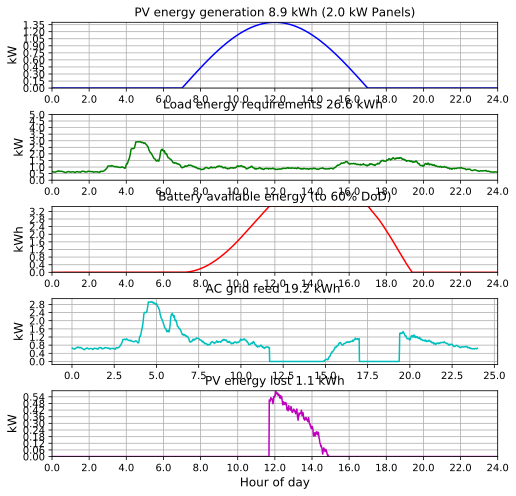

In [59]:
tstrt = 17.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 2000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 200. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.6 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 2500  # W maximum that the inverter can supply
maxBatCharge =  25# maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5);

## Daily cycles starting at 20:00, minimal supply, no grid storage

If the battery discharge is postponed till 20:00 the peak household use is fed from the grid. The battery can supply current until about midnight.  In this mode any load scheduling at 20:00 can be handled sufficiently.

This configuration employs a 48 V, 200 Ah battery. It turns out that a 2000 W panel is sufficient (on average). Any larger PV panel output will not be utilised.  In this configuration there is a significant grid feed input.   The battery is discharged to 60% of full capacity.

Batteries require 3456 Wh, 72 Ah from PV panels to charge
Batteries charge at 1200 W (25.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 8.9 kWh 
PV energy lost 1.1 kWh 
PV energy stored in grid 0.0 kWh 
PV energy used 7.8 kWh 
Grid feed 19.2 kWh 
Energy cost R1.50/kWh 
Net energy from PV 7.8 kWh 29.3% of total, cost savings R11.69/day 
Net energy from grid 18.8 kWh 70.7% of total, remaining grid cost is R28.21/day 


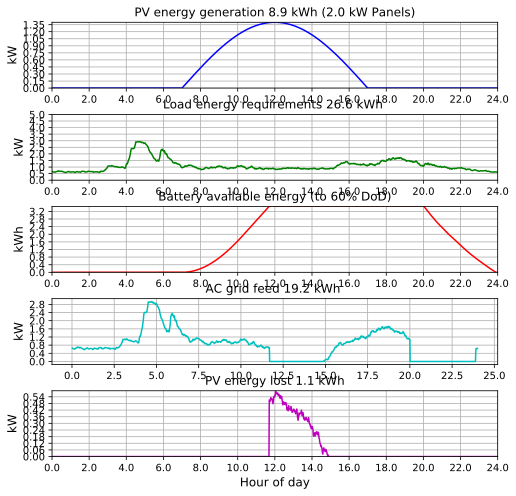

In [60]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 2000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 200. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.6 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 2500  # W maximum that the inverter can supply
maxBatCharge = 25 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5);

## Daily cycles no discharge, energy stored in the grid

If the energy is stored in the grid (no battery charge and discharge) the day-time energy is stored in the grid and then withdrawn at night from the grid.

This configuration employs a 48 V, 200 Ah battery. It turns out that a 2000 W panel is sufficient (on average). Any larger PV panel output will not be utilised.  In this configuration there is a significant grid feed input.   The battery is discharged to 60% of full capacity.

Batteries require 0 Wh, 0 Ah from PV panels to charge
Batteries charge at 0 W (0.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 8.9 kWh 
PV energy lost 0.0 kWh 
PV energy stored in grid 1.8 kWh 
PV energy used 7.1 kWh 
Grid feed 19.5 kWh 
Energy cost R1.50/kWh 
Net energy from PV 8.9 kWh 33.5% of total, cost savings R13.37/day 
Net energy from grid 17.7 kWh 66.5% of total, remaining grid cost is R26.52/day 


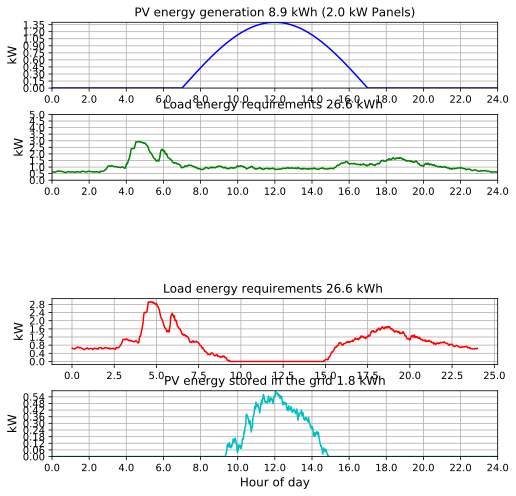

In [61]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 2000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 0. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.6 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 3000  # W maximum that the inverter can supply
maxBatCharge = 0 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5, storedinGrid=True);

Batteries require 0 Wh, 0 Ah from PV panels to charge
Batteries charge at 0 W (0.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 13.4 kWh 
PV energy lost 0.0 kWh 
PV energy stored in grid 5.5 kWh 
PV energy used 7.9 kWh 
Grid feed 18.7 kWh 
Energy cost R1.50/kWh 
Net energy from PV 13.4 kWh 50.3% of total, cost savings R20.05/day 
Net energy from grid 13.2 kWh 49.7% of total, remaining grid cost is R19.84/day 


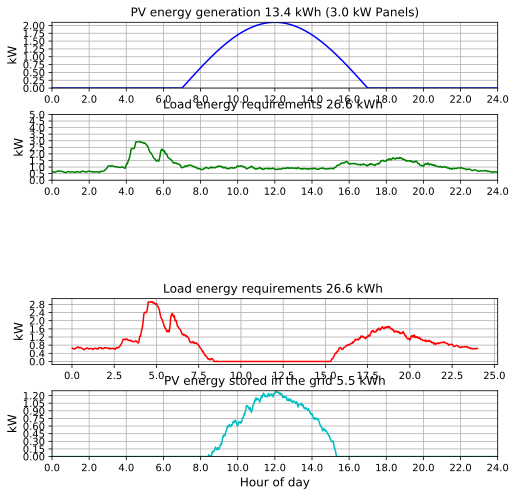

In [62]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 3000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 0. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.6 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 3000  # W maximum that the inverter can supply
maxBatCharge = 0 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5, storedinGrid=True);

Batteries require 0 Wh, 0 Ah from PV panels to charge
Batteries charge at 0 W (0.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 26.7 kWh 
PV energy lost 0.0 kWh 
PV energy stored in grid 17.9 kWh 
PV energy used 8.8 kWh 
Grid feed 17.8 kWh 
Energy cost R1.50/kWh 
Net energy from PV 26.7 kWh 100.5% of total, cost savings R40.11/day 
Net energy from grid -0.1 kWh -0.5% of total, remaining grid cost is R-0.21/day 


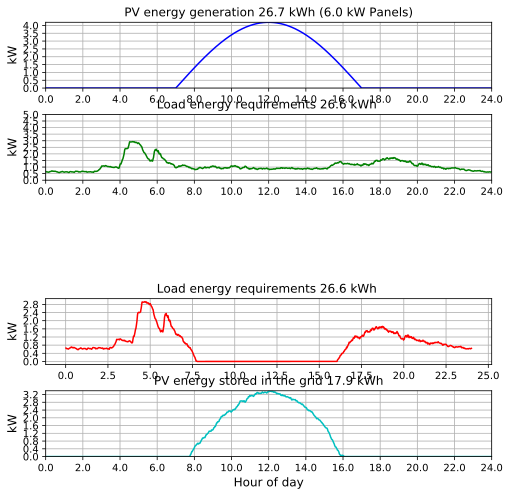

In [63]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 6000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 0. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.6 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 3000  # W maximum that the inverter can supply
maxBatCharge = 0 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5, storedinGrid=True);

## Daily cycles starting at 20:00, larger battery and solar panel, no grid storage

If the battery discharge is postponed till 20:00 the peak household use is fed from the grid. The battery can supply current until about midnight.  In this mode any load scheduling at 20:00 can be handled sufficiently. In this calculation a larger battery and PV panel is used together with a deeper battery discharge.

It turns out that making adequate use of a larger panel requires  a slightly deeper battery discharge a larger battery.  Note that to make use of the larger PV panel, the battery charge rate must be increased to 20 A.
In this configuration there is quite a bit less grid feed input.   


Batteries require 6480 Wh, 135 Ah from PV panels to charge
Batteries charge at 960 W (20.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 13.4 kWh 
PV energy lost 0.5 kWh 
PV energy stored in grid 0.0 kWh 
PV energy used 12.9 kWh 
Grid feed 14.5 kWh 
Energy cost R1.50/kWh 
Net energy from PV 12.9 kWh 48.3% of total, cost savings R19.28/day 
Net energy from grid 13.7 kWh 51.7% of total, remaining grid cost is R20.61/day 


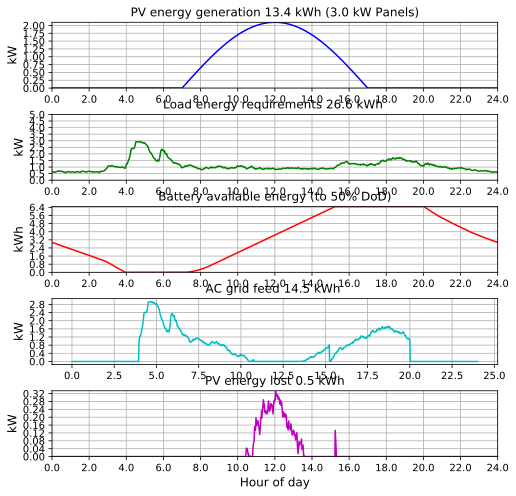

In [64]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 3000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 300. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.5 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 2500  # W maximum that the inverter can supply
maxBatCharge = 20 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5);

## Daily cycles starting at 20:00, even larger battery and solar panel, no grid storage

If the battery discharge is postponed till 20:00 the peak household use is fed from the grid. The battery can supply current until about midnight.  In this mode any load scheduling at 20:00 can be handled sufficiently. In this calculation a large battery and PV panel is used together with a deeper battery discharge.

It turns out that making adequate use of a larger panel requires  a slightly deeper battery discharge a larger battery.  Note that to make use of the larger PV panel, the battery charge rate must be increased to 30 A.
In this configuration there is quite a bit less grid feed input.   

Batteries require 8640 Wh, 180 Ah from PV panels to charge
Batteries charge at 1440 W (30.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 17.8 kWh 
PV energy lost 1.8 kWh 
PV energy stored in grid 0.0 kWh 
PV energy used 16.0 kWh 
Grid feed 11.6 kWh 
Energy cost R1.50/kWh 
Net energy from PV 16.0 kWh 60.2% of total, cost savings R24.00/day 
Net energy from grid 10.6 kWh 39.8% of total, remaining grid cost is R15.89/day 


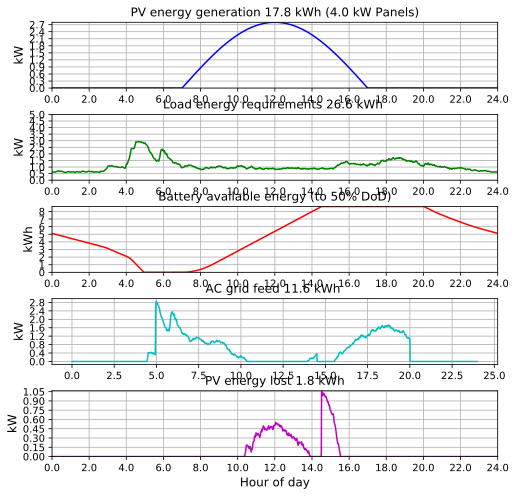

In [65]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 4000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 400. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.5 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 2500  # W maximum that the inverter can supply
maxBatCharge = 30 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5);

## Pushing extremes, no grid storage

It is evident that larger battery capacity has bigger impact on self-sufficiency than PV panel rating.  In this run increasing the panel capacity has far less effect than increasing battery capacity.  The larger panel capacity also requires increased charge current.

Batteries require 13824 Wh, 288 Ah from PV panels to charge
Batteries charge at 1920 W (40.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 22.3 kWh 
PV energy lost 1.8 kWh 
PV energy stored in grid 0.0 kWh 
PV energy used 20.5 kWh 
Grid feed 20.1 kWh 
Energy cost R1.50/kWh 
Net energy from PV 20.5 kWh 77.0% of total, cost savings R30.72/day 
Net energy from grid 6.1 kWh 23.0% of total, remaining grid cost is R9.18/day 


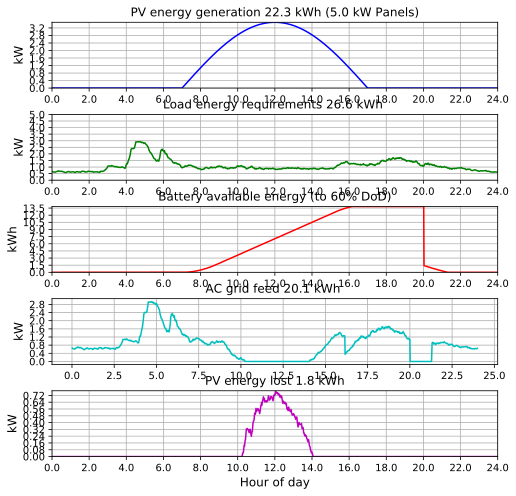

In [66]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 5000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 800. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.6 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 4500  # W maximum that the inverter can supply
maxBatCharge = 40 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5);

## Optimal system, feeding into the grid, discharging battery to 60%

With 6 kW panels and inverters, feeding/draining into/from the grid, the sweet spot can be obtained with 800 Ah batteries, with DoD of 60%.  This system will be able to supply the average load with zero net infeed from the grid, but short term peaks still require the grid to feed from.  In this configuration we store in both the grid and the batteries and the components are balanced such that the net grid feed is zero.

Batteries require 13824 Wh, 288 Ah from PV panels to charge
Batteries charge at 1920 W (40.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 26.7 kWh 
PV energy lost 0.0 kWh 
PV energy stored in grid 4.8 kWh 
PV energy used 21.9 kWh 
Grid feed 18.1 kWh 
Energy cost R1.50/kWh 
Net energy from PV 26.7 kWh 100.5% of total, cost savings R40.11/day 
Net energy from grid -0.1 kWh -0.5% of total, remaining grid cost is R-0.21/day 


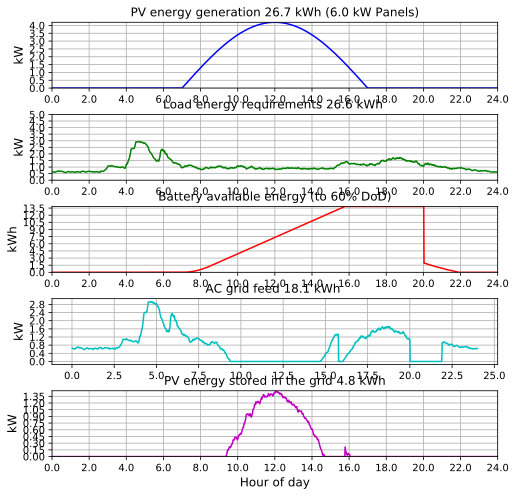

In [67]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 6000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 800. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.6 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 6000  # W maximum that the inverter can supply
maxBatCharge = 40 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5, storedinGrid=True);

## Off-grid

This system will not require grid electricity and the batteries are charged by day and discarged by night.
As outlined above the current simulation assumes that 7 kWh will be fed in from the grid on a split wiring house.  We attempt to simulate off-grid here by forcing the system to feed about -7 kWh back into the grid.  This is approximately equivalent to off-grid.

Batteries require 25229 Wh, 526 Ah from PV panels to charge
Batteries charge at 1920 W (40.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 26.7 kWh 
PV energy lost 4.8 kWh 
PV energy stored in grid 0.0 kWh 
PV energy used 22.0 kWh 
Grid feed -5.6 kWh 
Energy cost R1.50/kWh 
Net energy from PV 22.0 kWh 82.5% of total, cost savings R32.93/day 
Net energy from grid 4.6 kWh 17.5% of total, remaining grid cost is R6.96/day 


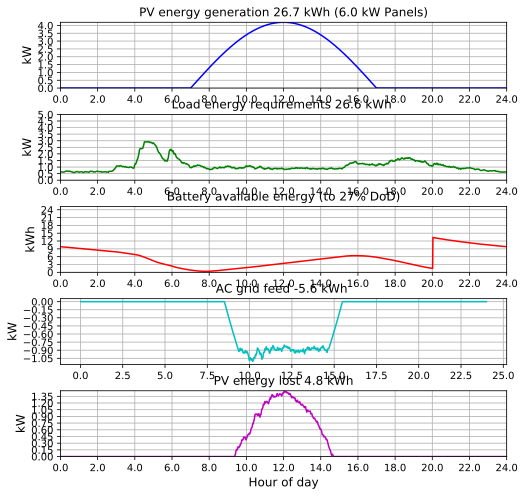

In [68]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 6000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 800. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.27 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 6000  # W maximum that the inverter can supply
maxBatCharge = 40 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5, storedinGrid=False);

## Optimal system, feeding into the grid, battery only for backup DoD= 0.999

With 6 kW panels and inverters, feeding/draining into/from the grid. In this run the battery DoD is set to 100%, which means that the battery is not discharged during the night. This system will be able to supply the average load with zero net infeed from the grid, but short term peaks still require the grid to feed from.  In this configuration we store in mainly in the grid (the batteries only provide backup) and the components are balanced such that the net grid feed is zero.

Batteries require 35 Wh, 1 Ah from PV panels to charge
Batteries charge at 1920 W (40.0 A) maximum
Required household energy total 26.6 kWh 
PV energy generated 26.7 kWh 
PV energy lost 0.0 kWh 
PV energy stored in grid 17.9 kWh 
PV energy used 8.8 kWh 
Grid feed 17.8 kWh 
Energy cost R1.50/kWh 
Net energy from PV 26.7 kWh 100.5% of total, cost savings R40.11/day 
Net energy from grid -0.1 kWh -0.5% of total, remaining grid cost is R-0.21/day 


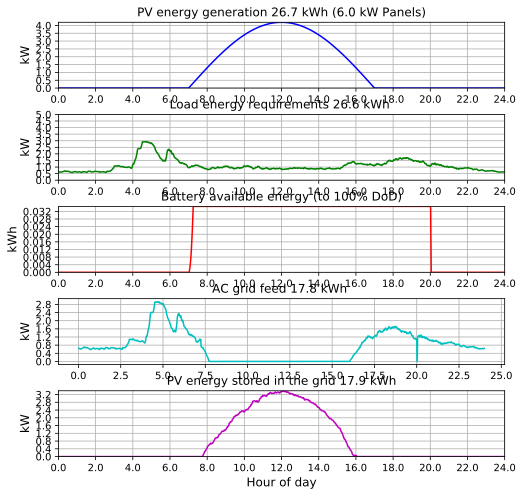

In [69]:
tstrt = 20.00 * 60  # time in minutes at which the battery inverter is switched on
ratingPV = 6000.  # W minimum installed panel capacity
batvolt = 48 # nominal battery voltage
batCap = 800. * batvolt  # Wh  battery capacity in Ah * voltage
batDoD = 0.999 # depth of dischage
batACEff = 0.9 # battery discharge efficiency only this much is available as AC power
batDCEff = 0.9 # battery charge efficiency only this much is available as charge
maxInverter = 6000  # W maximum that the inverter can supply
maxBatCharge = 40 # maximum battery charge current

calcProfile(tstrt, ratingPV, batvolt, batCap, batDoD, batACEff, batDCEff,
            maxInverter,maxBatCharge,reqAC,removedAC,cost=1.5, storedinGrid=True);

# Solar Irradiance and Climatic Data

A 'typical meteorological year' (TMY) is a collation of selected weather data for a specific location, generated from a data bank much longer than a year in duration. It is specially selected so that it presents the range of weather phenomena for the location in question, while still giving annual averages that are consistent with the long-term averages for the location in question. The TMYs are data sets of hourly values of solar radiation and meteorological elements for a 1-year period.  <http://rredc.nrel.gov/solar/old_data/nsrdb/1991-2005/tmy3/>. The TMY data are available in three formats, the most recent and comprehensive being the [TMY3](http://www.nrel.gov/docs/fy08osti/43156.pdf) dataset. TMY3 data comprises long tables with these column headings: Month, Day, Hour, Beam Irradiance (W/m^2), Diffuse Irradiance (W/m^2), Ambient Temperature (C), Wind Speed (m/s), Plane of Array Irradiance (W/m^2), Cell Temperature (C), DC Array Output (W), and AC System Output (W).

TMY data  for South Africa is available [commercially](http://geosun.co.za/satellite-derived-data/) but the cost did not warrant the purchase for my need.  Limited climatic data for 14 sites in South Africa and surrounding countries, are available at no cost, thanks to the [Sauran initiative](http://sauran.net/Page/About).


## PVWatts

The [NREL PVWatts](http://pvwatts.nrel.gov/pvwatts.php) provides a very useful estimate of solar PV electricity generation.  The  [PVWatts model](http://www.nrel.gov/docs/fy14osti/60272.pdf) uses TMY3 data together with a reasonably comprehensive model to predict the PV system performance.

In the Harare analyses below the following system parameters were used as input to PVWatts:
    
|Parameter|Value|
|-|-|
|DC System Size (kW)|3|
|Module Type|Standard|
|Array Type|Fixed (open rack)|
|Array Tilt (deg)|20 / 30 / 50|
|Array Azimuth (deg)|0 (North)|
|System Losses|14%|
|Invert Efficiency|96%|
|DC to AC Size Ratio|1.1|



## Harare, Zimbabwe Data

A search for TMY3 data revealed no Pretoria data, but proposed that the Harare ((17$^\circ$51$^\prime$S, 31$^\circ$02$^\prime$E)) data could be relevant.  The [Harare climate](https://weatherspark.com/averages/29149/Harare-Mashonaland-East-Zimbabwe) climate and altitude are quite similar to the [Pretoria climate](https://weatherspark.com/averages/29023/Lanseria-Gauteng-South-Africa) in terms of temperature and seasonal rain patterns (dry winters and rainy summers).  The only significant difference is distance from the Equator: 17$^\circ$S for Harare and 25$^\circ$S for Pretoria.  This means that the day/night duration variation between the two sites is somewhat different.

In [70]:
def toint(instr):
    return int(instr)

def tofloat(instr):
    return float(instr)

PVkW = 3.0

dicConvert = {0:toint, 1:toint, 2:toint, 3:toint, 4:toint, 5:tofloat, 6:tofloat, 7:tofloat, 8:tofloat, 9:tofloat, 10:tofloat}
dicMonths = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}

The PVWatts simulator was used to calculate the predicted performance for three panel elevation/title angles: 20, 30 and 50 degrees.  The 50-degree data are not shown here because the output is considerably lower than at smaller angles.

AC Output power divided by plan irradiance is 2.12 kW/(W/m2))
AC Output power divided by plan irradiance is 2.12 kW/(W/m2))


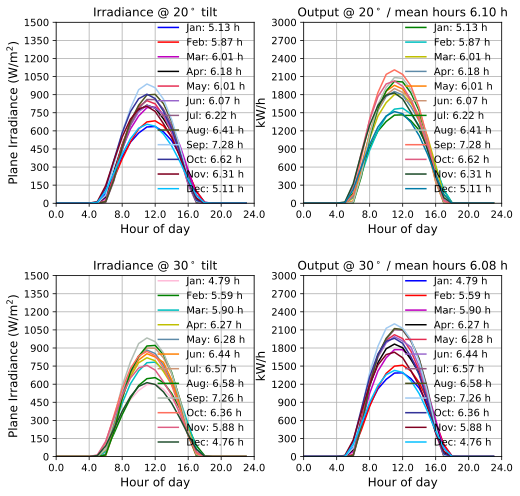

In [71]:
p = ryplot.Plotter(1,2,2, figsize=(8,8));
effH = []
har = {}
for i,angle in enumerate([20, 30]):
    har = pd.read_csv('data/20150615-{:2d}-deg-pvwatts_hourly.csv'.format(angle), skiprows=18, converters=dicConvert, comment='#')
    har.columns = ['Month','Day','Hour','BeamIrrad','DiffIrrad','AmbTemperature','WindSpeed','PlaneIrrad',
                        'CellTemperature','DCOutput','ACOutput']
    
    for month in range(1,13):

        harmon = har[har.Month==month].copy()
        dayMon = harmon.shape[0]/24.
        hard = harmon.groupby('Hour').mean()

        effH.append(hard['ACOutput'].sum()/(PVkW * 24. * dayMon))

        p.plot(i*2+1, hard.index.values, hard['PlaneIrrad'],'',
               'Hour of day','Plane Irradiance (W/m$^2$)',label=['{}: {:.2f} h'.format(dicMonths[month],effH[-1])],
               pltaxis=[0,24,0,1500 ], maxNX=6);  
        p.plot(i*2+2, hard.index.values, hard['ACOutput'],'',
               'Hour of day','kW/h',label=['{}: {:.2f} h'.format(dicMonths[month],effH[-1])],
               pltaxis=[0,24,0,3000 ], maxNX=6);  

        
        currentP = p.getSubPlot(i*2+1);
        currentP.set_title('Irradiance @ {}$^\circ$ tilt'.format(angle));
        currentP = p.getSubPlot(i*2+2);
        currentP.set_title('Output @ {}$^\circ$ / mean hours {:.2f} h'.format(angle, np.asarray(effH).mean()));

    # calculate the ratio of ouput power to input irradiance
    harnz = har[har['PlaneIrrad']!=0].copy()
    etop = (harnz['ACOutput'] / harnz['PlaneIrrad']).mean()
    print('AC Output power divided by plan irradiance is {:.2f} kW/(W/m2))'.format(etop))

In the analysis above we plot the irradiance and DC power output for all the months of the year.  It was quite surprising to observe that the winter output and summer outputs are not significantly different. In fact, during summer months the (average) output is lower than in winter, despite the longer days. The explanation is simple: during summer months the longer day is offset against increased cloud cover.  During winter months the days are shorter but the skies are clear.  This means that the panels need not be tilted for optimal production in winter months, they should be tilted for optimal production in summer!  This observation of course only only applies to the site considered here, with summer rainfall conditions.

The analysis also include an effective production time calculation, normalised against the solar panels PV rating.  The total energy (kWh) production was divided by the PC rating (3 kW) leading to the effective production time.  The idea is that if we multiply the panel PV rating by the effective production time, we can find the total energy produced by the panels.  The interesting observation here is that the effective production time does not differ much between summer and winter.  The value is around 6.1 hours for the Harare installation.  We will review this effective production time later for other sites as well.

The final observation here is that the power production is a factor 2.1 times the irradiance. Note that this number includes are area of the panel and all losses in the system.


## Pretoria Sauran Data

The [Sauran data for Pretoria](http://sauran.net/ShowStation.aspx?station=5) currently runs over a two-year period.  This is relatively short compared to the TMY3 data, but still significantly better than no data!  The Pretoria climate is summarised [here](https://weatherspark.com/averages/29023/Lanseria-Gauteng-South-Africa).


The Sauran data is not in TMY3 format and we will not be doing a full PVWatt analysis on this data. Instead, we will plot the data and compare to the Harare data.  The Sauran data of relevance here include:
GHI: Global horizontal irradiance [W/m^2],
DNI: Direct normal irradiance [W/m^2],
DHI: Diffuse horizontal irradiance [W/m^2], and
Air_Temp: Air temperature [degC].

The DNI applies to a panel fully directed towards the sun. To determine the irradiance on the fixed panel the angle between the sun and the panel normal must be determined.

After some analysis there appears to be strange behaviour in the data.  Further processing is postponed till later.


In [72]:
# def todatelements(instr):
#     return re.split("\W+", instr)

# dicConvert = {1:toint,2:tofloat,3:tofloat,4:tofloat,5:tofloat,6:tofloat,7:tofloat,8:tofloat,9:tofloat,10:tofloat,11:tofloat}
# sar = pd.read_csv('data/20041023_UPR_H.dat', skiprows=3, converters=dicConvert, comment='#')
# sar.columns = ['Date','RecNum','GHI_CMP11','DNI_CHP1','DHI_CMP11','Air_Temp','BP','RH','Rain_Tot','WS','WD','WD_SD']
# #add DNI to DHI to get total irradiance
# sar['TotalIrrad'] = sar['DNI_CHP1'] + sar['DHI_CMP11']
# #split date time string into individual numbers
# sar['Year'], sar['Month'], sar['Day'], sar['Hour'], sar['Minute'] = zip(*sar['Date'].map(todatelements))
# sar.drop(['Minute', 'Date', 'RecNum','BP','RH','Rain_Tot','WS','WD','WD_SD'],axis=1, inplace=True)
# #get the mean over years, retain month, day, hour
# sar = sar.groupby([sar.Month, sar.Day, sar.Hour, ]).mean() 


## Bush Power Installation

[Bush Power](http://www.bushpower.co.za/) has a 6.6 kW solar system running in Midrand, about 20 km from Pretoria. They are  making the performance data publicly available on the [Sunny Portal](https://www.sunnyportal.com/Templates/PublicPageOverview.aspx?plant=5e54271d-c1a0-451a-a36d-f7be800aac80&splang=en-US).  The Bush Power installation has been in operation since the beginning of 2015.  The data from the Sunny portal was captured manually on order-of-magnitude.

From the [picture](http://www.bushpower.co.za/) is evident that the solar panels were mounted for convenience on the roof of an existing building. The orientation of this building is not known, and it may be concluded that the panels are not oriented very effectively.  This is evident in the low effective production time shown below.

In [73]:
bpd = {1: 30.65, 2:33.9, 3:30.2, 4:26, 5:23.87, 6:22.67, 7:23 }
bpd = pd.DataFrame(np.asarray([[item,bpd[item]] for item in bpd.keys()]),columns=['Month','DailykWh'])
bpd['Efftime'] = bpd['DailykWh']  / 6.6
print(bpd)


   Month  DailykWh   Efftime
0    1.0     30.65  4.643939
1    2.0     33.90  5.136364
2    3.0     30.20  4.575758
3    4.0     26.00  3.939394
4    5.0     23.87  3.616667
5    6.0     22.67  3.434848
6    7.0     23.00  3.484848


# My installed system

Since the first versions of this document we installed (February 2016) a system comprising an IMEON 3.6 and 12x YL255P Yingli (3 kW, 20 m$^2$ total area) solar panels. The panels are mounted on the tile roof at an angle of about 25 degrees from the horizontal, facing due North.

![images/YGE_60_Cell_Series_EN_Page_1.png](images/YGE_60_Cell_Series_EN_Page_1.png)


![images/YGE_60_Cell_Series_EN_Page_2.png](images/YGE_60_Cell_Series_EN_Page_2.png)

The panel area is 1.63 m$^2$, providing a maximum power output of 255 W, or 150 W/m$^2$.

Note that the solar panels lose 0.5% power output efficiency per degree C increase. If the panel temperature goes up by 10 degC, the efficiency drops by 5%.  In summer with high solar irradiance we get about the same output as in winter with less influx, but with cooler panels.

The key Imeon details are as follows:

![images/IMEON36manual01.png](images/IMEON36manual01.png)

![images/IMEON36manual02.png](images/IMEON36manual02.png)

![images/IMEON36manual03.png](images/IMEON36manual03.png)


At present the inverter is grid tied, so we use the grid as energy storage.  This is possible because (1) the IMEON can feed excess energy back into the grid and (2) our (20-year old) electricity energy meter has a spinning wheel, which reverses its spin when we feed energy back into the grid. So, presently we generate surplus energy during the day, push it back into the grid, and then consume the energy again at night.  At the time of writing this, the system has been operating for five weeks. We had not yet received a utility bill to verify the amount of energy saved. Edit: During 2017 I saved about R800 per month on the electricity bill by feeding into the grid.  During 2019, because of the steep rise in electricity costs this will probably increase to R900+ per month.

South Africa does not yet have a policy governing small scale-grid fed PV systems, and hence there is no price differential on buying and selling energy into the grid.  Currently we push into the grid at the same price at which we buy from the grid.

We decided not to install batteries, because of the high price and limited lifetime --- presently we store energy for free in the grid!  This means that we do not have power during load shedding - we are still stuck with gas, notebook batteries, candles and LED flashlights.  We don't really watch TV so this this is no great loss.  If the utility company replaces the spinning wheel energy meters with electronic meters (which may not meausure grid feed) we would be forced to consider batteries.

At present we are not yet able to accurately measure the amount of generated energy, we simply read total energy from the Imeon inverter screen at the end of the day. We also do not record this value.  Some time in the future, the plan is to build an energy meter that will measure and record the PV energy as well as the energy fed back into the grid.


My (2016) Imeon cannot do this, but later versions support parallel connection, called multi-stacking that allows the user to grow his installation in 3 kW increments. See https://imeon-energy.co.za/smart-grid-type-en-za/multistacking/.
*The Multistacking feature allows to synchronise multiple Imeon inverters in parallel to the grid.
This installation topology supports up to 6 Imeon inverters installed in parallel to grid. 
Each inverter will still be connected to its individual solar array and battery bank but thanks to the Multistacking application they will coordinate their performance to offset common loads. Adding to that, each inverter still comes with its own backup output for essential loads, providing a possibility to secure power supply for multiple critical circuits. The solar installation becomes a modular system that can evolve as needed. If the solar installation covers a percentage of the total energy needs, the user can, if he wishes, increase the size of the system by adding more inverters to the stack.*

## Split Wiring

From the information shown further down  below, it is clear that the house's distribution board must be split into high load (stove, geyser, washing machine, pool pump, some plugs etc.) and low load sections (some plugs and lights).  This would require rewiring of the entire house network.

The high load sections must be fed directly from the grid and not from the inverter.  The low load sections can then be fed from the inverter (which is also supported from the grid).  Because of the hydrid nature of the IMEON and its ability to feed excess energy back into the grid, the surplus energy not used in the low-load section can be fed back into the high load section (which is directly tied to the grid). 

We have not yet split the DB board, because all the PV energy is fed back into the grid and the full house load is directly tied to the grid (no output taken from the inverter at present).

The following diagramme shows the Imeon and solar panel wiring as implemented, and the proposed split wiring (not implemented).

![images/wiring-final-b.png](images/wiring-final-b.png)




## Energy Generated

As from 2016-03-18 I moved the Efergy meter from the household consumption line to the inverter grid feed line.  The Efergy therefore measures the energy generated and pushed back into the grid.  The Efergy data is pushed to <http://pvoutput.org/> to capture the data at 5-minute intervals for plotting and statistical analysis.  

![images/pvoutput-home.PNG](images/pvoutput-home.PNG)

You can view the energy generation [here](http://pvoutput.org/intraday.jsp?id=49038&sid=44672).  There is a PVOutput app available for Android and IPhone. The results as displayed in the Android app for March 21 is shown below.  It was a good day with 18.4 kWh generated.  There were some clouds in the afternoon, but only briefly.

![images/pvgeneration_2016-03-21.png](images/pvgeneration_2016-03-21.png)

The same day's results as displayed on the PVOutput web page is as follows:
![images/pvgeneration_2016-03-21b.png](images/pvgeneration_2016-03-21b.png)

The following graph shows the efficiency of the panels over a month time period in autumn (neither high summer or low winter).  The interesting information is the scale on the right side of the graph.  It shows the total output of the system divided by the open circuit voltage times the short circuit current of the panels.  The unit is hours, which is something **equivalent to the number of hours of sunlight on the panel for the sun statically exactly normal on the panels**, for the full duration.   In other words this is more or less the **number of effective hours of sunlight for operation at the panels' peak output**, i.e., the total energy output is this time multiplied by the panels' peak output.
Previously,  in this document I elaborate the point that we should expect about six hours of this direct flux per day. The measurements, however, show that we only get five hours (more or less).  Note that this measurement include the energy loss in the inverter (which should be in the mid-90% according to the specification).

![images/pvoutEfficiency.PNG](images/pvoutEfficiency.PNG)



## Long term ouput 

The following picture (probably the most important in the entire study) shows the PVOuput of measurements over several years. Note that the years 2016 and 2019 are partial years ans show slightly lower output as a result.  The table below the graph shows the average power generation for each year.

It is very clear that I get around effectively 4.66 hours of power generation at the 3 kW panel rating per day.  This factor accounts for seasonal variation, cloudy days, etc.  It is also very satisfying to see that my small panel has already generated almost 16 MW/h since installation. This probably lowered the climatic temperature increase by less than a millionth of a degree, but it feels good anyway!


![pvoutput-2016-2019.png](images/pvoutput-2016-2019.png)




## Seasonal variation

Summer time and winter time generates practically the same quantity of electricity!
The reason for this is that winter time is cooler (18 deg C max) and cloudless, wheres summer is much hotter (40 deg C max), with potentially higher cloud cover.

![pvgeneration-seasonalupto2019.png](images/pvgeneration-seasonalupto2019.png)

It was rather surprising to see that the solar panel data indicated significant cloud cover also in winter --- which is not our rainy season.

![pvgeneration-seasonalcloudcover.png](images/pvgeneration-seasonalcloudcover.png)




## Time of day

In the mornings the panels are cooler, whereas later in the day the panels are warmer with lower output. The following two graphs show the results for 2019-03-15, a cloudless day.  Of course, cloud cover will change these ratios.

Also note that at my location solar noon at the date for the below figure is 12:14 clock time, which skews the graph by 28 minutes (a longer morning and a shorter afternoon).


![pvgeneration-time-of-day20190315](images/pvgeneration-time-of-day20190315.png)

![pvgeneration-time-of-day20190315b](images/pvgeneration-time-of-day20190315b.png)



## Storing in the grid

The huge solar farms in the Karoo and elsewhere in the world all generate electricity  feeding into the grid, with no battery storage. The grid is the storage.

Micro installations such as mine can also feed into the grid with the appropriate electronics (the Imeon does). There are however a few sticky considerations:

1. Your electricity meter must support feeding electricity into the grid.  Not all meters does. 

    The old [electromechanical meters](https://en.wikipedia.org/wiki/Electricity_meter) with the rotating disk can run forward if you pull energy from the grid or it can run backwards if you push energy into the grid.  The direction and speed of turn has to do with the phase between the current and voltage. If the phase reverses (pushing into the grid) the disk spins the opposite direction. The meter counts the number of revolutions, so if you push energy into the grid the number counts down and you effectively sell electricity to the utility company.
    
    Modern electronic meters may not have the ability to 'reverse', depending on the method used to calculate the power. If the measurement and calculation include the phase between current and voltage, it should in principle, be able to 'reverse'. If the measurement technique does not use phase between voltage and current (i.e., just the product of the two), you a feeding into the grid and while paying the normal rates as if you are using the electricity, the meter is unable to sense the direction of energy flow. So make sure that you understand the meter operation before connecting to the grid!
    
1. Some local authorities are contemplating using a differential tariff when buying and selling. If you are feeding into the grid (assuming you have a reversing meter) the local authority may perhaps only buy from you at 60% or 80% (or whatever) of the selling price. This means that you must push a bit more than you can pull for a zero net cost. There was talk some time ago that Port Elizabeth and Cape Town are considering doing this. I don't know the current situation.

1. The anti-islanding interface between the inverter and the grid disconnect you from the grid when the grid is down.  This is to ensure that the power lines on the grid are safe when the power is down (your feed might kill someone working on the grid). This means that when Eskom is down, all the sunlight in the world does not help me (with no batteries) because the anti-islanding device disconnects the inverter from my electricity supply.  This is a terrible feeling: I know I have 3 kW on the roof but none of it reaches into my house.


The following video shows my electricity meter running backwards during the day when energy is pushed into the grid.


In [74]:
%%HTML
<video width="640"  controls>
  <source src="images/electricity_20190301_133323.mp4" type="video/mp4">
</video>

## Batteries

This document does not report on battery selection.  I have done extensive research into the available battery types, lifetimes and the associated prices.  There is considerable fuzziness (and possibly downright lying) in the matter of  battery selection. My conclusion at present (2016) is that there is no 'best battery'.  Some batteries are more suited to some needs than others but in the final analysis, it appears that the total lifecycle cost for all solar battery types is more or less equal. Cheaper batteries must be replaced more often and expensive batteries less often, to the total cost is about the same.  But do your own research.

Just make sure that you buy a battery designed for regular charge/discharge cycling and not a car battery.  The less expensive batteries have lower cycle lifetimes and shelf lifetimes, the more expensive batteries have longer cycle and shelf lifetimes. Over the longer term lifecycle analysis, in terms of cost per energy unit per day, all batteries appear to be equally expensive, you simply make the choice of how frequently you want to replace the batteries. But don't trust my views, do you own research.

2019 Edit: Much have happened since I wrote this in 2016, with different types of Lithium ion batteries now available. The price of batteries still remain very high.  When buying batteries watch out for the following:

1. Be very wary of super special price offerings.  If an offer is too good to be true, there could be a snake somewhere. Normal business offerings of some discount to promote sales is probably safe, but why would a dealer sell batteries at, or below, cost?

1. Battery lifetime shortens dramatically at higher ambient temperatures (especially lead-based batteries).  If your battery storage room is hot (my garage faces West, 35-40 deg C in summer), select a battery that will take the heat better. Also perhaps consider active ventilation or even water cooling.  The effect of temperature on the lifetime of a lead-acid battery is typically as follows:

    ![lead-acid-battery-lifetime.png](images/lead-acid-battery-lifetime.png)

1. Battery lifetime shortens with deeper discharges. I have not made the sums but it might be more cost effective to buy more batteries (higher Amp-hour capacity) and allow a less deep discharge overnight (e.g., depth of discharge (DoD) of 70% instead of 30 or 50%).  The batteries will cost more but should last longer.  The added benefit of a larger battery capacity is that you would be able to survive better during regular power outages or a cloudy day. It is going to cost you, however!  

    The effect of DoD on the lifetime of a lead-acid battery is typically as follows:

    ![lead-acid-battery-lifetime-DoD.png](images/lead-acid-battery-lifetime-DoD.png)
    
    TThe effect of DoD on the lifetime of a LiFePO4 battery is typically as follows:

    ![LiFePO4-battery-lifetime-DoD.png](images/LiFePO4-battery-lifetime-DoD.png)

Comparing lead acis Gel/AGM batteries with LiFePO4, consider the cost of a small 200 Ah battery bank that is discharged *daily* to 50% DoD:

1. Lead-Acid:  four units of the [Enervision E-Guard NM12-200L 200Ah 12V Gel/AGM Battery](https://www.sustainable.co.za/enervision-e-guard-nm12-200l-200ah-12v-gel-agm-battery.html) will cost you R27k.  The data sheet for this battery states that the battery capacity will drop to 60% after 1600 cycles at 50% DoD.  If we express the battery cost as Rand per cycle, this battery has a cost of R17/cycle (i.e., R17 per day).  This battery will cost you R510 per month.
1. LiFePO4: one unit of [Freedom Lite Home 10/7 Lithium LiFePO4 Battery ](https://www.sustainable.co.za/freedom-lite-home-10-7-lithium-lifepo4-battery-system.html) R88k. The data sheet for this battery states a 60% capacity lifetime of 7000 cycles at 50% DoD. If we express the battery cost as Rand per cycle, this battery has a cost of R12.5/cycle (i.e., R12.5 per day). This battery will cost you R375 per month.

It is evident that the lead-acid battery is 35% more expensive than the LiFePO4 battery despite the large difference in initial capital outlay. Add to this the fact that you have to replace the lead-acid battery 4.4 times more frequently than the LiFePO4 battery, which means more inconvenience and four times higher transport and re-installation cost.  

If the batteries are used for standby emergency use only (not discharged daily) the shelf life time of the two batteries should be considered up to 20 years for LiFePO4 and 12 years for lead acid if kept at 24 deg C (see the graph above).  If the lead acid battery is stored at 35 deg C the lifetime drops to between four and five years.

## Batteries for emergency only

It would make sense to go for an option where the battery is only depleted if the grid falls away, not every evening.  But this only makes sense if you can feed in to the grid during the day.  In this mode, your main storage mechanism remains the grid: you  push energy into the grid during daytime and pulls at night. Makes good sense, you are saving battery discharge cycles.  The battery is only there for supply when the grid goes down.  In this mode you have power when the grid is down, but you only use the battery in case of emergency, not as a matter of routine operation.  Just make sure that your inverter can operate in this mode.

The Imeon operating modes are shown below.  

- My system currently operates in what they call 'On-Grid Mode', meaning that the inverter pushes the grid, while my home consumption comes from the grid (not the inverter).  In this mode the Imeon just pushes out energy not managing the destination; some of the energy goes to the grid and some to my home.  If there is no solar power generation, nothing goes to the grid and my home feeds from the grid.

- Imeon's 'Back up mode' seems to operate as follows: 
    - Energy produced by the panels is first used to charge the battery, thereafter to the home, and if any energy is left, it is pushed onto the grid.
    - Batteries are charged from the panels first and if there is no solar energy, the batteries are charged from the grid.
    - The home (consumer) is supplied by energy in the following priorities: (1) solar panels first, then (2) the grid and if (3) none of the first two are available, from the batteries.
    
    This means that the batteries are only discharged if the grid is off line. You save discharge cycles: one of the main battery killers!

![imeon-modes.png](images/imeon-modes.png)



# Conclusion

## Observations

In conclusion, note the following observations.  When reviewing these observation note that our target is to review a PV system with 3 kW battery inverter and a 6 kW peak demand capability.

1. There is a 'background' 24/7 consumption of around 500 W to 1000 W.  This includes items such as computers, lights, alarm, garden fountain, two fridges and two freezers, a satellite TV system, etc.  The energy consumption here is already 12 KWh.

1. To the 'background' power must be added all intermittent use devices such as blower hair driers, kitchen devices, hand tools, the stove hob and oven, the geyser and room heating in winter.

1.  Our energy consumption is well within the 3 kW margin for 85% of the time. A 2 kW or smaller system would require too many adaptations and inconveniences. At a 3 kW rating, and assuming that the geysers are not working) we are already constrained to only one heating device (e.g., one stove plate or kettle) in the kitchen at the time.

2. The measurements indicate power use higher than 6 kW.  We would have to find the means to limit the peak demand, or alternatively put these high demand devices directly on the grid, not passing through the inverter.  The items to be considered here include the heat generating devices such as geysers, stove hob and oven, the tumble drier and room heaters.

1. The analysis above includes both geysers on the electricity supply.  The geysers should be supplied with a direct solar heating unit, which will alleviate the electricity use somewhat (currently using about 4 to 5 kWh per day).  Keep in mind that even solar heated geysers still may require electricity from the grid (early morning in winter, or on cloudy days).


Therefore, a 3 kW system is insufficient as a replacement for grid supply. It would require too many lifestyle changes (carefully controlling heating devices) to be practical. 

If the house wiring is split between low current (lights and light duty plugs) and high current (stove, geyser, heavy duty plugs, etc.)  the 3 kW system can keep the house going under emergency conditions for a limited time.

If you really want to operate off-grid, the installed capability must be around 10 kW to handle peaks.  

## Good compromise solution, not off-the-grid

Taking all of the above into account, my ideal installation would not require too many lifestyle changes and have the following configuration:

1. 6 kW solar panel capacity (about 40 sq metres, will require a large roof). This system will be able to supply a sustained 30 kWh per day (if the sun shines).

1. Two multistacked Imeon 3.6 inverters in back-up mode that can supply 6 kW from panels mainly (batteries are for backup), and also supply 12 kW peak (we remain connected to the grid).

1. A 800 Ah capacity, 48 V battery bank that will serve as backup only. If the grid is down during night time the battery will discharge to 60%.  This should also  give us a little more than one day of operation if the grid falls away completely.

1. This system will feed excess energy into the grid during day time, and then pull the same amount of energy back from the grid at night.  

1. This system can operate off-grid, but then the batteries will discharge to about 25% to 30% DoD during the night.  Furthermore, the power peaks must be limited to 6 kW.




# Cost analysis

## Three levels of system complexity

This graphic summarises one possible approach to residential solar power.  I am not sure where it was originally published, but believe it comes from an article in January 2015 on finweek.com.

![three-levels.jpg](images/three-levels.jpg)

The article states: 

*Three types of solar systems are available in SA, offering various degrees of reliance on Eskom and different payback periods.*

1. *The grid-tie system*

    *The grid-tie system is connected to the Eskom grid. This means you generate solar energy but still have access to the grid when necessary. The problem with this system, however, is the interconnectivity. Because the grid-tie uses the same electrical wiring as the grid, if Eskom’s grid shuts down, then your solar system shuts down too.*

2. *The off-grid system*

    *The off-grid system is completely independent of the grid and is not a supplementary source of energy, but the only source for your home. This would mean all your appliances rely on solar energy. This system is very expensive and generally not recommended. According to Dallas Cass, managing director at S&P Power Units, the off-grid system has a payback period of about eight years.*

3. *The hybrid system*

    *The hybrid system is a combination of the grid-tie and off-grid ones. This system is recommended by Van der Spoel. He says that South Africans currently need a system that will protect them against load-shedding and therefore supplement the power grid. Although initial installation of the hybrid is costly, this supplementary system reduces reliance on the grid and therefore eventually results in savings. Cass says that the payback period on a hybrid solar system is usually around four and a half years and that this period will decrease with the pending electricity price increases.*

    *The solar panels of any solar system have a lifespan of over 25 years, while the battery bank, which is the most expensive component part of the system, needs to be replaced every few years.*

I like their proposed three levels of sophistication (and cost).  The entry level keeps only the most essential services going, whereas the top level aligns more or less with my view of the ideal system.

I do, however, disagree with the proposed configurations on two accounts:

1. Buy a better, more expensive inverter (Viktron or Imeon, not a cheap Chinese product). Look at the fine print, they do differ!

1. Buy larger batteries. The small battery capacity proposed here will result in very deep depth of discharge (DoD) levels, considerably shortening the battery life time.  There is little point in buying a low capacity and cheap battery if it must be replaced every few years.  Rather go big at the outset and enjoy a low maintenance solution.

If you do buy more expensive equipment, the prices quoted here more or less agrees with my costing shown below.  For more accurate costing, get a quote from a supplier.

## My views

The following is a rough order-of-magnitude analysis.  Prices vary with time and current market conditions, so your analysis would probably differ from this. Prices are in South African Rand (ZAR).

### No Batteries

In 2016: The 3 kW Imeon and 3 kW Yingly solar panels (no batteries) were installed in 2016 at a cost of R66k for equipment and R6k for installation. Rewiring he house would have costed around R20k to R40k, but this was not done. 

At the current (2019) my electricity savings of about R900 per month, I should recover the capital amount in seven years. If the price increases at the rate it currently does (2019) the capital will be recovered in five to six years.  If we include the cost of capital (interest I could have gained in the bank) the term extends somewhat, but I believe the costs would be recovered in ten years.

If the equipment survives beyond the pay-back term, the solar panels will provide a nice no-cost, non-taxable, income per month.


### With batteries for daily use  / off-grid

In 2019: A quick Internet search in March 2019 yielded the following cost estimate for my ideal system defined above:

- 24 x 250 W [panels](https://www.sustainable.co.za/solar-power/solar-panels.html?module_watts=306) @ R1.8k = R44k
- Two [Imeon 3.6](https://www.sustainable.co.za/imeon-3-6-3kw-hybrid-smart-inverter.html) R80k
- 800 Ah batteries [Freedom Lite Business 40/28 Lithium LiFePO4](https://www.sustainable.co.za/freedom-lite-business-40-28-lithium-lifepo4-battery-system.html) R310k
- Installation and sundries R35k
- **Total** R 470k, of which 66% is the cost of the battery).

Suppose you decide on a smaller and less expensive battery (this should last for one, perhaps two of Eskom's load shedding sessions):

- 24 x 250 W [panels](https://www.sustainable.co.za/solar-power/solar-panels.html?module_watts=306) @ R1.8k = R44k
- Two [Imeon 3.6](https://www.sustainable.co.za/imeon-3-6-3kw-hybrid-smart-inverter.html) R80k
- One of the following batteries:
    - 200 Ah batteries [Freedom Lite Home 10/7 Lithium LiFePO4 Battery ](https://www.sustainable.co.za/freedom-lite-home-10-7-lithium-lifepo4-battery-system.html) R88k. 
    - 300 Ah batteries [Freedom Lite Home 15/11 Lithium LiFePO4 Battery ](https://www.sustainable.co.za/freedom-lite-home-15-11-lithium-lifepo4-battery-system.html) R127k
    - 400 Ah batteries [Freedom Lite Home 20/14 Lithium LiFePO4 Battery ](https://www.sustainable.co.za/freedom-lite-home-20-14-lithium-lifepo4-battery-system.html) R164k
- Installation and sundries R35k
- **Total** R 250k, R290l or R323, of which 35% to 51% is the cost of the battery).


Now, you don't have to do any sums to realise  that the cost of batteries completely kills the investment argument regarding solar power.  You buy batteries because you want the convenience of not being in the dark when Eskom is down. Or you buy batteries because of the strategic need for electricity for business or safety reasons.  You **do not** buy batteries from an investment point of view. By the same token, for normal residential housing you decide to move off-grid by emotional reasons not because you can save money. The situation is different in business and farming where other strategic consideration apply.

When it comes to batteries, the saying "less is more" is definitely not wise or true.  Rather, you must realise that "you get what you pay for".

If you do not want to buy large batteries, I would recommend to not go smaller than the second proposal above: 6 kW generation and 200 Ah battery.  A 200 Ah, 48 V battery, with an inverter efficiency and a DoD of 50% should give you about 4.3 kWh. This means that with 1 kW load (not much, no heating devicec), you will have power for four hours.  If you want to cook or heat something with a 4 kW load (oven plus stove plate or geyser) the battery will reach a DoD of 50% in one hour.





Good luck!

## Python and [module versions, and dates](https://github.com/rasbt/watermark)

In [75]:
# to get software versions
# https://github.com/rasbt/watermark
# https://github.com/rasbt/watermark/blob/master/docs/watermark.ipynb
# you only need to do this once
# pip install watermark

%load_ext watermark
# %watermark -v -m -p numpy,scipy,pyradi -g -d
%watermark -v -m -p numpy,scipy,pyradi,pandas -g -r -u -d -b -i

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
last updated: 2019-03-28 2019-03-28T10:41:33+02:00

CPython 3.7.1
IPython 7.2.0

numpy 1.15.4
scipy 1.1.0
pyradi 1.1.4
pandas 0.23.4

compiler   : MSC v.1915 64 bit (AMD64)
system     : Windows
release    : 7
machine    : AMD64
processor  : Intel64 Family 6 Model 94 Stepping 3, GenuineIntel
CPU cores  : 8
interpreter: 64bit
Git hash   : 2a5a42129b6bbab9a8991aaffb95396d387372db
Git repo   : https://github.com/NelisW/miscellania.git
Git branch : master
